In [1]:
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt
from bids import BIDSLayout
import pandas as pd
import numpy as np
from itertools import product
import os
import mne

from util.viz import (
    plot_fsaverage, 
    plot_fsaverage_rgb, 
    plot_rgb_legend,
    zoom_visual_cortex,
    zoom_visual_cortex_more,
    plot_decoding_model,
    plot_decoding_roc,
    plot_shap,
    crop_screenshot,
    screenshot_mpl,
    display_screenshot
)

In [2]:
BIDS_DIR = 'bids_temp'
FIG_DIR = 'figures'

if not os.path.exists(FIG_DIR):
    os.mkdir(FIG_DIR)

In [3]:
layout = BIDSLayout(BIDS_DIR, derivatives = True)

In [4]:
def add_label(ax, label, x_offset = -.2, y_offset = .1, size = 50):
    xmin, xmax = ax.get_xlim()
    xscale = xmax - xmin
    ymin, ymax = ax.get_ylim()
    yscale = ymax - ymin
    ax.text(
        xmin + x_offset*xscale, ymax + yscale*y_offset, 
        label, size = size, weight = 'bold'
    )

In [5]:
# load group-averaged R2
def load_group_avg(desc):
    fs = layout.get(desc = desc, suffix = 'r2')
    for i, f in enumerate(fs):
        if i == 0:
            r2 = np.load(f)
        else:
            r2 += np.load(f)
    r2 /= len(fs)
    return r2[0, :]

r2_model = load_group_avg('model')
r2_control = load_group_avg('control')
r2_delta = load_group_avg('difference')

Gtk-Message: 16:55:44.963: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:55:57.928: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:56:06.249: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:56:11.341: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:56:16.747: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:56:23.652: Failed to load module "canberra-gtk-module"


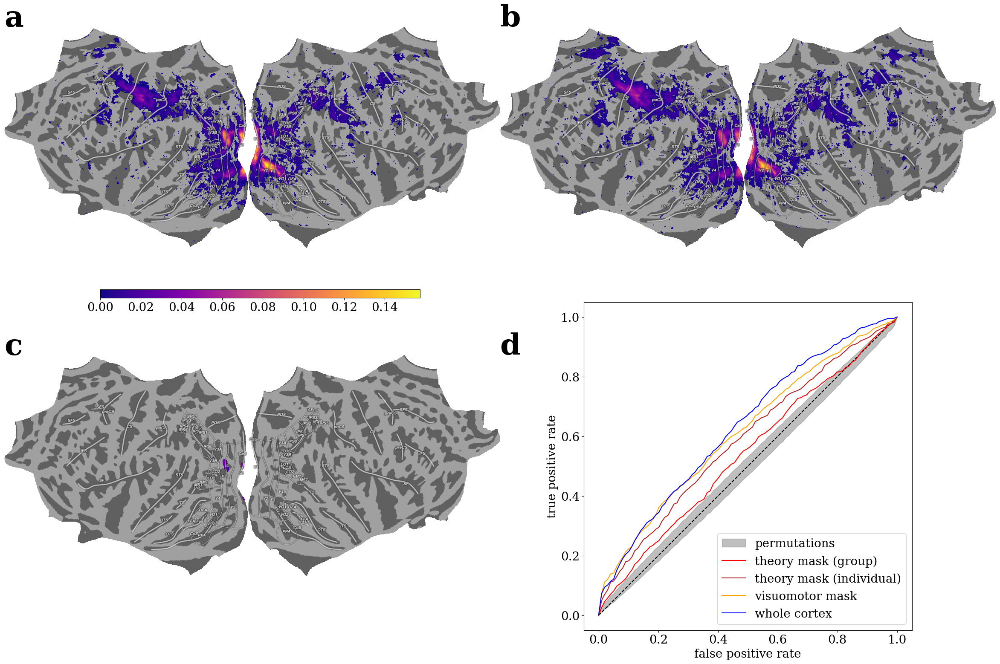

In [6]:
# load masks for plots
fs = layout.get(subject = 'group', suffix = 'mask')
control, delta, model = (np.load(f) for f in fs)
vmax = np.max(np.stack([r2_model, r2_control, r2_delta]))

plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize = (30, 20))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0)

ax = fig.add_subplot(gs[0, 0])
plot_fsaverage(
    r2_model, 
    mask = model,
    positive = True, 
    vlim = vmax,
    sulci = True,
    ax = ax,
    colorbar = True,
    cbar_loc = (.2, .5, .25, .01)
)
add_label(ax, 'a', x_offset = 0, y_offset = 0)
add_label(ax, 'b', x_offset = 1, y_offset = 0)
ax = fig.add_subplot(gs[0, 1])
plot_fsaverage(
    r2_control, 
    mask = control,
    positive = True, 
    vlim = vmax,
    sulci = True,
    ax = ax,
    colorbar = False
)
ax = fig.add_subplot(gs[1, 0])
plot_fsaverage(
    r2_delta, 
    mask = delta,
    positive = True, 
    vlim = vmax,
    sulci = True,
    ax = ax,
    colorbar = False
)
#zoom_visual_cortex(ax)
add_label(ax, 'c', x_offset = 0, y_offset = 0)
add_label(ax, 'd', x_offset = 1, y_offset = 0)

ax = fig.add_subplot(gs[1, 1])
plot_decoding_roc(layout, 'group', ax, letters = False)
ax.set_aspect('equal')

fpath = os.path.join(FIG_DIR, 'group.jpeg')
plt.savefig(fpath, dpi = 500, bbox_inches = 'tight')
plt.show()

In [19]:
f = layout.get(subject = 'group', desc = 'difference', suffix = 'pvals')[0]
print(np.load(f).min())

0.004399120175964807


In [7]:
fs = layout.get(desc = 'theoryGroup', suffix = 'auc')
auc = np.stack([np.load(f) for f in fs], 0)
print(layout.get_subjects(desc = 'theoryGroup', suffix = 'auc'))
print(auc[:,0])
print(auc[:,0].mean())

['01', 'dd', 'gg', 'uu']
[0.57780658 0.50614156 0.5318425  0.53544598]
0.5378091557491246


In [8]:
fs = layout.get(desc = 'theory', suffix = 'auc')
auc = np.stack([np.load(f) for f in fs], 0)
print(layout.get_subjects(desc = 'theory', suffix = 'auc'))
print(auc[:,0])
print(auc[:,0].mean())

['01', 'dd', 'gg']
[0.60022312 0.52058862 0.63797955]
0.5862637667822668


Gtk-Message: 16:58:09.833: Failed to load module "canberra-gtk-module"


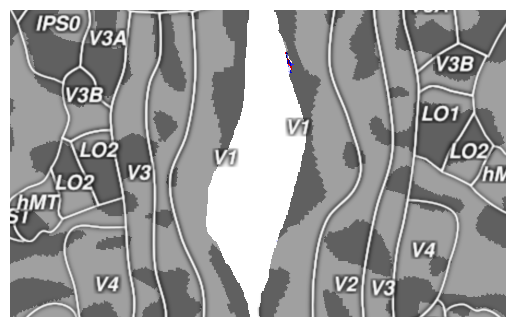

In [9]:
ax = plt.subplot()
plot_decoding_model(
    layout, 'gg', 
    show_sulci = False, 
    model = 'theory', 
    weight_type = 'filters', 
    ax = ax, 
    colorbar = False
)
zoom_visual_cortex(ax)
plt.show()

Gtk-Message: 16:58:16.014: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:20.096: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:23.432: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:26.668: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:30.264: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:35.255: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:37.776: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:40.961: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:43.978: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:47.412: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:51.053: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:54.437: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:58:57.292: Failed to load module "canberra-gtk-module"
Gtk-Message: 16:59:00.899: Failed to load module "canberra-gtk-module"
Gtk-Me

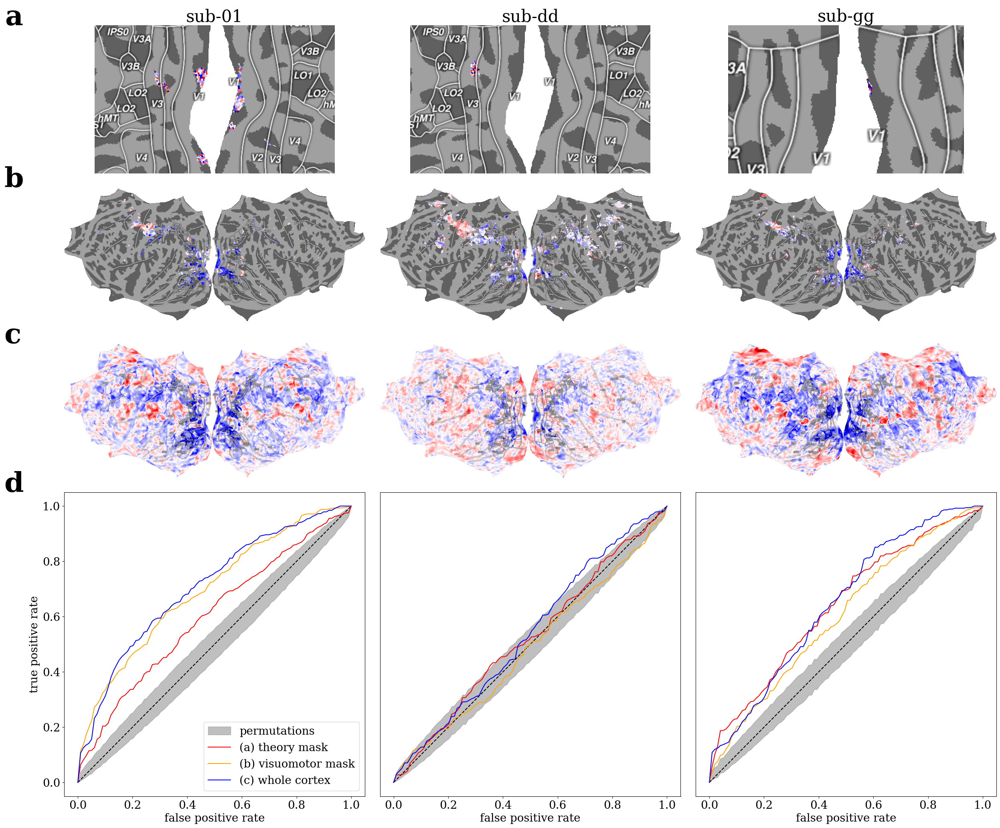

In [10]:
subs = layout.get_subjects(scope = 'decoding', desc = 'theory')
mods = ('theory', 'visuomotor', 'cortex')
n_subs = len(subs)
n_mods = len(mods)

w = 30
h = w/2 + (w / n_subs)

plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize = (w, h))
gs = gridspec.GridSpec(n_mods + 2, n_subs, wspace = .05, hspace = .05)

labels = ('a', 'b', 'c', 'd')

for i, j in product(range(n_mods), range(n_subs)):
    ax = fig.add_subplot(gs[i, j])
    plot_decoding_model(
        layout, subs[j], 
        show_sulci = False if mods[i] == 'theory' else True, 
        model = mods[i], 
        weight_type = 'filters', 
        ax = ax, 
        colorbar = False
    )
    if mods[i] == 'theory':
        if subs[j] == 'gg':
            zoom_visual_cortex_more(ax)
        else:
            zoom_visual_cortex(ax)
    if i == 0:
        ax.set_title('sub-%s'%subs[j], size = 30)
    if j == 0:
        offset = -.375 if i == 0 else -.2
        add_label(ax, labels[i], x_offset = offset, y_offset = 0.)

for j in range(n_subs):
    ax = fig.add_subplot(gs[n_mods:, j])
    plot_decoding_roc(layout, subs[j], ax, legend = (j == 0))
    if j == 0:
        add_label(ax, labels[-1], x_offset = -.2, y_offset = 0.)
    else:
        ax.get_yaxis().set_visible(False)

fpath = os.path.join(FIG_DIR, 'decoding.jpeg')
plt.savefig(fpath, dpi = 500, bbox_inches = 'tight')
plt.show()

Using pyvistaqt 3d backend.



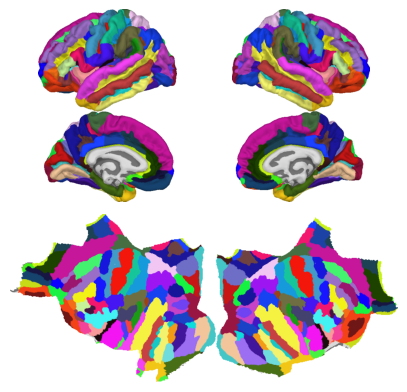

In [11]:
## draw atlas illustrating how cortex is unfolded into flatmap 

fill_rois = True

freesurfer_dir = os.path.join(
    layout.root, 'derivatives', 
    'fmriprep', 'sourcedata', 
    'freesurfer'
)
plot_kwargs = dict(
    subjects_dir = freesurfer_dir, 
    background = "white",
    offscreen = True
)
brain = mne.viz.Brain(
    "fsaverage", 
    surf = 'pial',
    hemi = 'lh',
    views = ['lateral', 'medial'],
    **plot_kwargs
)
brain.add_annotation('aparc.a2009s', borders = not fill_rois)
left = brain.screenshot()
brain.close()

brain = mne.viz.Brain(
    "fsaverage", 
    surf = 'pial',
    hemi = 'rh',
    views = ['lateral', 'medial'],
    **plot_kwargs
)
brain.add_annotation('aparc.a2009s', borders = not fill_rois)
right = brain.screenshot()
brain.close()

brain = mne.viz.Brain(
    "fsaverage", 
    hemi = 'both',
    surf = 'flat',
    **plot_kwargs
)
brain.add_annotation('aparc.a2009s', borders = not fill_rois)
flat = brain.screenshot()
brain.close()

fig = plt.figure(figsize = (5, 5))
gs = gridspec.GridSpec(4, 2, wspace = .0, hspace = .0)
ax = fig.add_subplot(gs[:2, 0])
display_screenshot(left, ax)
ax = fig.add_subplot(gs[:2, 1])
display_screenshot(right, ax)
ax = fig.add_subplot(gs[2:, :])
display_screenshot(flat, ax)
atlas = screenshot_mpl()
plt.show()

Gtk-Message: 17:01:44.258: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:01:46.704: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:01:51.989: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:01:54.579: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:01:57.803: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:02:01.589: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:02:05.345: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:02:07.832: Failed to load module "canberra-gtk-module"


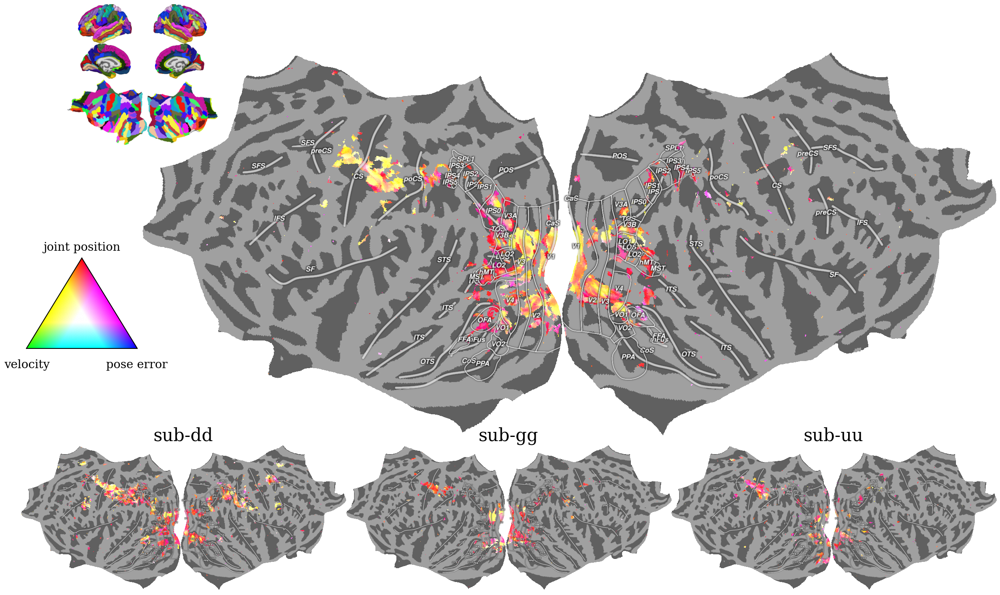

In [12]:
plt.rcParams.update({'font.size': 20})

fig = plt.figure(figsize = (30, 30 * 5/8))
gs = gridspec.GridSpec(8, 8, wspace = 0., hspace = 0.2)
ax = fig.add_subplot(gs[:2, :2])
display_screenshot(atlas, ax)
gs = gridspec.GridSpec(5, 8, wspace = 0., hspace = 0.2)
ax = fig.add_subplot(gs[2, 0])
plot_rgb_legend(ax)

ax = fig.add_subplot(gs[:4, 1:])
subs = layout.get_subjects(scope = 'shapley')
sub = subs.pop(0)
plot_shap(layout, sub, ax, label = False)

gs = gridspec.GridSpec(3, 3, wspace = 0., hspace = 0.15)
for i, sub in enumerate(subs):
    ax = fig.add_subplot(gs[-1, i])
    plot_shap(layout, sub, ax)

fpath = os.path.join(FIG_DIR, 'shapley.jpeg')
plt.savefig(fpath, dpi = 500, bbox_inches = 'tight')
plt.show()

In [13]:
## load the encoding model scores and masks for visualization

def load_encoding_scores(layout, model):
    '''
    loads R2 of voxelwise encoding models with FDR-correction masks
    '''
    subs = layout.get_subjects(scope = 'voxelwise')
    scrs = [np.load(f)[0, :] for f in layout.get(desc = model, suffix = 'r2', subject = subs)]
    scrs = np.stack(scrs, axis = 0)
    if model == 'difference': # use masks from main effect models 
        # so that we can plot the unthresholded difference scores
        m1 = [np.load(f) for f in layout.get(desc = 'model', suffix = 'mask', subject = subs)]
        m1 = np.stack(m1, axis = 0)
        m2 = [np.load(f) for f in layout.get(desc = 'control', suffix = 'mask', subject = subs)]
        m2 = np.stack(m2, axis = 0)
        masks = np.logical_or(m1, m2)
    else: 
        masks = [np.load(f) for f in layout.get(desc = model, suffix = 'mask', subject = subs)]
        masks = np.stack(masks, axis = 0)
    scrs[~masks] = np.nan
    return scrs

# this can take a while cause scores are stored with null dists
print('Loading theory model scores...')
model = load_encoding_scores(layout, model = 'model')
print('loading control model scores...')
cntrl = load_encoding_scores(layout, model = 'control')
print('loading difference scores...')
delta = load_encoding_scores(layout, model = 'difference')
print('Done!')

# and load mask from TFCE correction seperately so we can plot  
# thresholded difference scores after plotting unthresholded
subs = layout.get_subjects(scope = 'voxelwise')
fwer_mask = [np.load(f) for f in layout.get(desc = 'difference', suffix = 'mask', subject = subs)]
fwer_mask = np.stack(fwer_mask, axis = 0)

Loading theory model scores...
loading control model scores...
loading difference scores...
Done!


Gtk-Message: 17:13:53.585: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:13:56.384: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:13:59.714: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:04.233: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:07.355: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:09.776: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:12.891: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:20.688: Failed to load module "canberra-gtk-module"


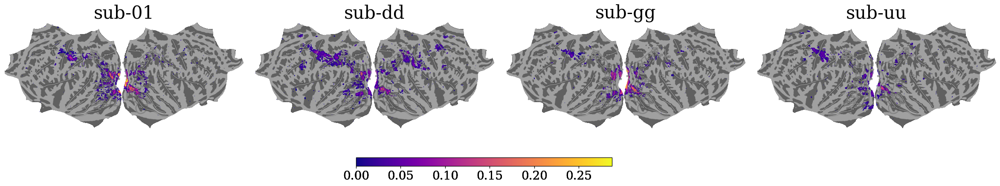

Gtk-Message: 17:14:55.904: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:14:58.572: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:01.624: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:05.933: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:10.995: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:13.450: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:16.432: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:19.517: Failed to load module "canberra-gtk-module"


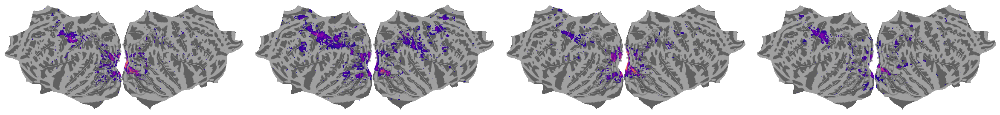

Gtk-Message: 17:15:56.262: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:15:59.883: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:02.893: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:06.605: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:09.771: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:12.230: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:17.697: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:20.624: Failed to load module "canberra-gtk-module"


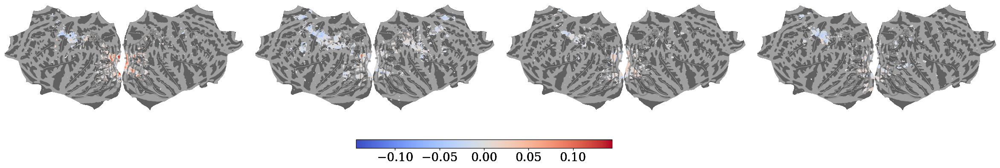

Gtk-Message: 17:16:55.945: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:16:58.984: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:17:01.964: Failed to load module "canberra-gtk-module"
Gtk-Message: 17:17:05.235: Failed to load module "canberra-gtk-module"


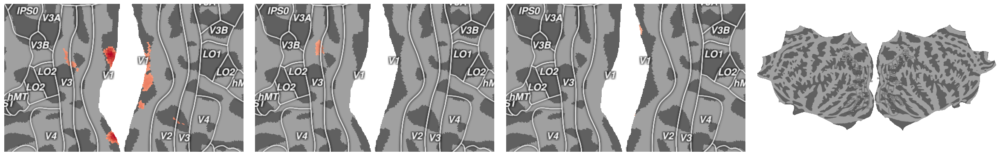

In [14]:
# pycortex insists on only one colorbar per figure,
# so we plot each score seperately so we can
# have all the colorbars we want

# every subject should use same colormap for easy comparison
vlim_mods = max([np.nanmax(np.abs(r2)) for r2 in (model, cntrl)])
vlim_diff = np.nanmax(np.abs(delta))

subs = layout.get_subjects(scope = 'voxelwise')
n_subs = len(subs)
w, h = 30, 20 # for full figure

mod_dir = os.path.join(FIG_DIR, 'encoding')
if not os.path.exists(mod_dir):
    os.mkdir(mod_dir)

plt.rcParams.update({'font.size': 20})

score_types = ('model', 'control', 'difference', 'masked')
for j, score in enumerate(score_types):
    fig = plt.figure(figsize = (w, h/4))
    gs = gridspec.GridSpec(1, n_subs, wspace = .05, hspace = 0.)
    for i, sub in enumerate(subs):
        ax = fig.add_subplot(gs[0, i])
        if score == 'model':
            scr = model
        elif score == 'control':
            scr = cntrl
        else:
            scr = delta
        plot_fsaverage(
            scr[i], 
            mask = fwer_mask[i] if score == 'masked' else None,
            positive = score in ('model', 'control'), 
            vlim = vlim_mods if score in ('model', 'control') else vlim_diff,
            sulci = (score != 'masked'),
            ax = ax,
            colorbar = (score in ('model', 'difference'))
        )
        if (score == 'masked') and (fwer_mask[i].sum() > 0):
            zoom_visual_cortex(ax) 
        if j == 0:
            ax.set_title('sub-%s'%sub, size = 30)
    plt.savefig(os.path.join(mod_dir, '%s.jpeg'%score), dpi = 500)
    plt.show()
        

/home/johnv/miniforge3/envs/myosuite/lib/python3.8/site-packages/PIL/Image.py:3186: DecompressionBombWarning: Image size (92864236 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


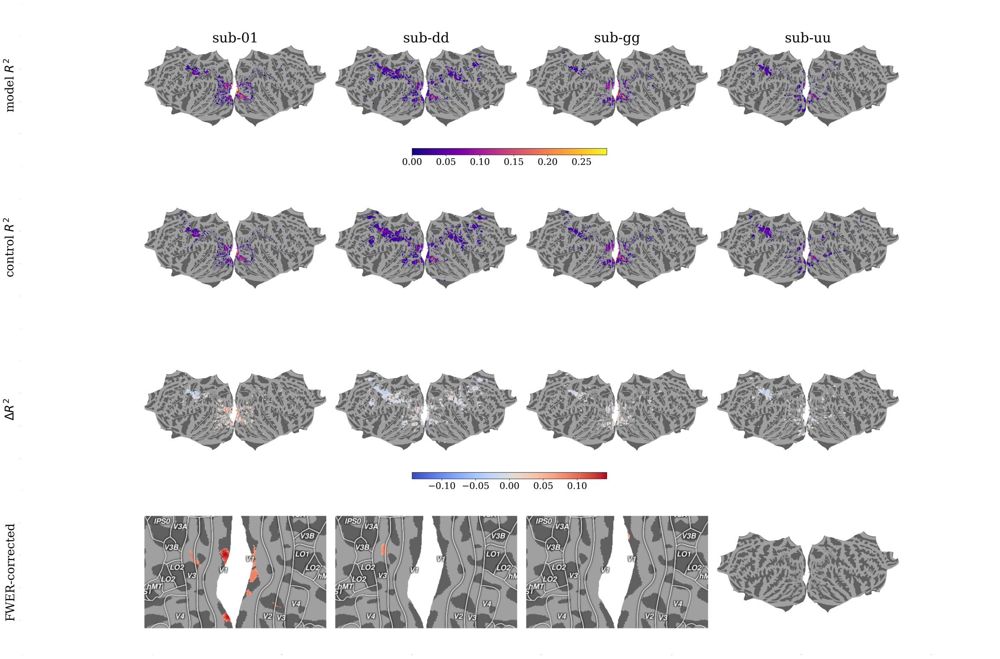

In [15]:
score_types = {
    r'model $R^2$': 'model.jpeg',
    r'control $R^2$': 'control.jpeg',
    r'$\Delta R^2$': 'difference.jpeg',
    'FWER-corrected': 'masked.jpeg'
}
n_types = len(score_types)

plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize = (w, h))
gs = gridspec.GridSpec(n_types, 1, wspace = .0, hspace = .0)

def plot_image(fname, ax, scr_dir = 'encoding'):
    f = os.path.join(FIG_DIR, scr_dir, fname)
    im = plt.imread(f)
    ax.imshow(im)
    # make axis ticks invisible 
    plt.setp(ax.spines.values(), alpha = 0)
    ax.tick_params(which = 'both', size = 0, labelsize = 0)

for j, (name, fname) in enumerate(score_types.items()):
    ax = fig.add_subplot(gs[j, 0])
    plot_image(fname, ax)
    ax.set_ylabel(name, size = 20)
    
im = screenshot_mpl()
plt.show()

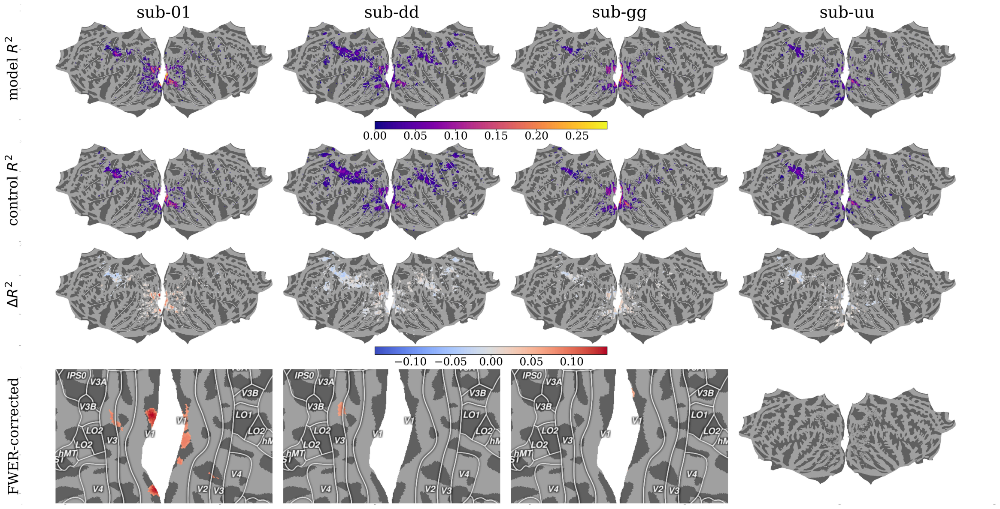

In [16]:
# now crop the un-needed white space from that image
nonwhite_pix = (im != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
last_nonwhite = np.where(nonwhite_col)[0][-1]
before_last = np.arange(nonwhite_col.size) < np.where(nonwhite_col)[0][-1]
after_first = np.arange(nonwhite_col.size) > 1.7*(nonwhite_col.size - last_nonwhite)
keep_col = nonwhite_col | (before_last & after_first)
cim = im[nonwhite_row][:, keep_col]
ratio = cim.shape[0] / cim.shape[1]
plt.figure(figsize = (30, 30*ratio))
plt.imshow(cim)
plt.gca().axis("off")
fpath = os.path.join(FIG_DIR, 'encoding.jpeg')
plt.savefig(fpath, dpi = 500, bbox_inches = 'tight')
plt.show()